#Objetivo del trabajo

El Objetivo del trabajo es realizar un algoritmo de procesamiento de imagenes para poder automatizar el conteo de células en la camara de Neubauer, que es un método manual utilizado en todos los laboratorios.

Para realizar el algoritmo, se tendran en cuenta todas las técnicas vistas en la materia, se evaluaran distintos métodos y se analizará cuál es el correcto y otorga un mejor resultado.

#Introducción

##Cámara de Neubauer

La cámara de Neubauer es una placa de vidrio grueso del tamaño de un portaobjetos de vidrio (30x70x4 mm). La región de conteo consta de dos áreas regladas de forma cuadrada. Hay depresiones o fosas a ambos lados o entre las áreas en las que están marcados los cuadrados dando así una forma de "H".

El área cuadriculada es de 3 mm^2 dividida en 9 cuadrados grandes cada uno con un área de 1 mm2. El gran cuadrado central (que se puede ver en su totalidad con el objetivo 10X), está dividido en 25 cuadrados medianos con líneas dobles o triples.

Cada uno de estos 25 cuadrados se divide nuevamente en 16 cuadrados pequeños con líneas simples, de modo que cada uno de los cuadrados más pequeños tenga un área de 1/400 mm2.

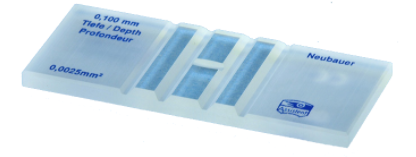



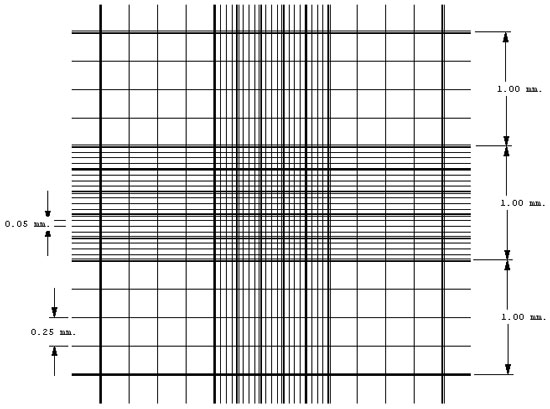

La cubierta de vidrio es un vidrio cuadrado de 22 mm de ancho. Para realizar el conteo, se coloca el vidrio en la parte superior de la cámara de Neubauer, cubriendo la zona central. El área reglada es 0,1 mm más baja que el resto de la cámara. De modo que cuando se mantiene un cubreobjetos en la región de conteo, hay un espacio de 0,1 mm (1/10 mm) entre el cubreobjetos y el área reglada. Estas dimensiones serán importantes para calcular el volumen de celulas al final.

##Uso de la cámara de Neubauer
**1. Preparación de la muestra**


Dependiendo del tipo de muestra, se debe preparar una preparación de una dilución con una concentración adecuada para el recuento celular. Normalmente, el rango de concentración para un recuento de células con cámara de Neubauer está entre 250.000 células / ml y 2,5 millones de células / ml.

Debe utilizarse una dilución adecuada de la mezcla con respecto al número de células a contar. Si la muestra no se diluye lo suficiente, las células estarán demasiado pobladas y serán difíciles de contar. Si está demasiado diluido, el tamaño de la muestra no será suficiente para hacer inferencias sólidas sobre la concentración en la mezcla original.

 
Por encima de 2,5 millones de células / ml (2,5 x 106), aumenta la probabilidad de errores de recuento, así como el tiempo y el esfuerzo necesarios para lograr un recuento de células fiable.
 
Por encima de 2,5 millones, es preferible diluir la muestra para obtener una concentración final más cercana al óptimo 1 millón por ml. Es importante anotar la dilución realizada en la muestra original.



**2. Preparación de la cámara de Neubauer**

Luego de limpiar la cámara de Neubauer, se coloca el vidrio en la zona central.

**3. Introducción de la muestra en la cámara de Neubauer**

Con una pipeta, se extraen 10uL de dilucion. Se coloca la punta de la pipeta contra el borde del cubreobjetos y se expulsa lentamente el líquido hasta que la cámara de recuento esté llena.



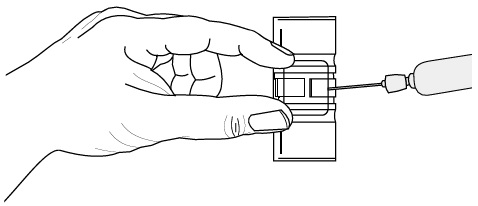


**4. Enfoque con microscopio y recuento celular**


Se coloca la  cámara de Neubauer en el microscopio. Con el objetivo de 10X, se puede observar el patrón de cuadrícula como en las partículas celulares. 

##Cálculo de células contadas

El número total de células por microlitro de muestra se puede calcular a partir del número de células contadas y el área contada. Esto se debe a que las áreas regladas de la cámara contienen un volumen exacto de muestra diluida.

Dado que solo se cuenta un pequeño volumen de muestra diluida, se debe utilizar una fórmula general para convertir el recuento en el número de células / microlitro.

Cálculo de la cámara de Neubauer:

$ Células por uL = \frac{Células contadas}{Área contada * Profundidad * Dilución}$

* El factor de dilución utilizado en la fórmula dependerá en cada caso
* La profundidad utilizada en la fórmula es siempre 0,1. 
* El área contada variará para cada tipo de recuento de celdas y se calcula utilizando las dimensiones del área reglada.



Los errores en el rango del 20-30% son comunes en este método debido a errores de pipeteo, errores estadísticos, errores de volumen de la cámara y errores del volumen de muestra introducido en la cámara. Independientemente, la cámara de Neubauer sigue siendo el método de recuento celular más utilizado en el mundo. Y por lo tanto, se plantea un algoritmo de procesamiento de imágenes para automatizar lo más posible el método.

#Base de datos utilizada

En el esta oportunidad, no se utilizó ninguna base de datos, sino que directamente se tomaron fotografías desde el microscopio , realizando los pasos mencionados anteriormente. En particular, se utilizó el azul de tripano para realizar la dilución de células. 

El azul de tripano una tinción que le permite distinguir las células muertas de las vivas. Cuando se mezcla con su muestra de células, las células muertas se tiñerán de azul con el tinte, lo que permite realizar la distinción.

Las imágenes fueron obtenidas con una cámara Nikon conectada al microscopio con uel objetivo de 10X. Al adquirir la imagen, la cámara no permite obtener una cuadricula de 4x4, pero si de 4x3. Por lo tanto se deberá tener esto en cuenta para el procesamiento de la imagen y para el cálculo de células en el volumen final


#Bibliografía



*   LaboratoryInfo.com. 2021. Manual Cell Counting With Neubauer Chamber - LaboratoryInfo.com. [online] Available at: <https://laboratoryinfo.com/manual-cell-counting-neubauer-chamber/> 
*  2021. [online] Available at: <https://www.emsdiasum.com/microscopy/technical/datasheet/68052-14.aspx>
*   Bitesize Bio. 2021. Cell Counting With a Hemocytometer: As Easy as 1, 2, 3.... [online] Available at: <https://bitesizebio.com/13687/cell-counting-with-a-hemocytometer-easy-as-1-2-3/> 


---



#Montado de Drive y funciones

##Montamos el drive e instalamos las librerías

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
##Instalar e importar librerías
!pip install SimpleITK

import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
import cv2
from scipy import signal
import scipy
!pip install SimpleITK

import numpy as np
import SimpleITK as sitk
import matplotlib.pyplot as plt
import cv2
from scipy import signal
import scipy
from skimage.segmentation import active_contour
from skimage.morphology import binary_closing, binary_opening, binary_dilation, binary_erosion
from scipy.ndimage.morphology import binary_hit_or_miss


     |████████████████████████████████| 48.4 MB 1.5 MB/s 


##Funciones  a utilizar

###Histograma

In [ ]:
def Histograma(Imagen):
  M = Imagen.shape[0]
  N = Imagen.shape[1]
  Histograma = np.zeros((1,256))

  for i in range(M):
    for j in range(N):
      tono = Imagen[i,j]
      Histograma[0,int(tono)] += 1

  return Histograma

In [ ]:
def histograma(im,N_bins):
  # im= imagen 
  # n_bins=cant de niveles de grises
  hist = np.array(np.zeros(N_bins))
  #Recorro la imagen píxel a píxel 
  for i in range(len(im)):
    for j in range(len(im[0])):
      nivel_de_gris = im[i,j]
      hist[nivel_de_gris] += 1
  return hist
  #Para plotearlo
  #plt.bar(np.arange(256), Histograma, width=1.2, align='edge')

###kmeans


In [ ]:
def kmeans(imagen,c1,c2,c3):
  #Paso 1: Defino centroides iniciales (c1,c2,c3)
  A = len(imagen)
  B = len(imagen[0])

  media1 = 0
  media2 = 0
  media3 = 0
  #Paso 2: Recorremos píxel a píxel la imagen y calculamos la distancia de cada píxel (nivel de gris) al centroide
  #Nivel de gris del píxel es n 
  i = 0
  
  while (media1 != c1) and (media2 != c2) and (media3 != c3):
    imagenNuevac1 = np.zeros([A,B])
    imagenNuevac2 = np.zeros([A,B])
    imagenNuevac3 = np.zeros([A,B])
    
    lista1=[]
    lista2=[]
    lista3=[]

    if (i != 0):
      c1 = media1
      c2 = media2
      c3 = media3
    
    for i in range(A):
      for j in range(B):
        #calculo la distancia de ese pixel a cada centroide
        distancia1 = abs(c1-imagen[i,j])
        distancia2 = abs(c2-imagen[i,j])
        distancia3 = abs(c3-imagen[i,j])
        listaDistancias = [distancia1, distancia2, distancia3]
        #Cuál es la mínima distancia?
        minimo = np.min(listaDistancias)
        
        if (minimo == distancia1):
          lista1.append(imagen[i,j])
          imagenNuevac1[i,j] = 255
        elif (minimo == distancia2):
          lista2.append(imagen[i,j])
          imagenNuevac2[i,j] = 255
        else:
          lista3.append(imagen[i,j])
          imagenNuevac3[i,j] = 255
    #Paso 3: Una vez que ya recorrí toda la imagen tengo que agarrar los píxeles que forman parte de cada uno de los clusters y hacer un promedio que va a resultar en el valor del nuevo centroide del clúster 1
    #Debo transformar c1, c2 y c3 a números enteros
    media1 = int(np.sum(lista1)/len(lista1))
    media2 = int(np.sum(lista2)/len(lista2))
    media3 = int(np.sum(lista3)/len(lista3))
   #Paso 4: Una vez recalculados los centroides, repetir el proceso (desde Paso 2), hasta que el valor de los centroides no cambie más o tengan una diferencia muy chica (definir un error permitido)
    i = i+1
  
  return (imagenNuevac1,imagenNuevac2,imagenNuevac3,c1,c2,c3)


###Otsu

In [ ]:
def Otsu(imagen):
  #Paso 1: Calculamos el histograma normalizado (dividido por la cantidad de píxeles)
  p= Histograma(imagen)/np.size(imagen) #Agarro todos mis neveles de grises. 

  #Paso 2: Definimos un vector (np.zeros) de varianza inter-clase (dimensión 256)
  L = 256 #por ser uint8
  Varianza = np.zeros(L)
  # Puedo armarme un vector de todos ceros que tenga longitud 256, arranco el ciclo para iterar , calculo la varianza para cada valor de t y 
  #la voy guardando en ese vector que previamente defini con todos ceros. Entonces consigo un vector donde cada elemento del vector me va a decir la varianza interclase para ese nivel de gris. 
  #Veo cual es el valor maximo, veo cual es la posicion dentro del vector. Esa posicion me va a decir cual es el umbral de otsu, el umbral optimo con el que voy a binarizar mi imagen.

    # Calculo el valor de muT
  #muT= valor promedio total que tengo en la imagen, valor medio de cada calse
  
  
  

  #Paso 3: Armo fórmulas para calcular la varianza 256 veces, con t=1...256
  #Arranco con T=1 hasta T=256 y armo el algoritmo de manera tal que haga 256 iteraciones y calculo la varianza interclase para cada valor de t.

   # Calculo los valores de w0 y w1  
  #w1= probabilidad de encontrar pixeles mayores a 100 en mi imagen original ( t=100)
  #w0=  probabilidad de encontrar pixeles menores a 100 en mi imagen original ( t=100). w0 +w1=1

  #Aplico formulas del algoritmo
  for t in range(1,L):
    w0 = mu0 = mu1 = varianza = 0
    
    for i in range(t):
      w0 = w0 + p[0,i]
      mu0 = mu0 + i * p[0,i]
    
    for i in range(t,L):
      mu1 = mu1 + i * p[0,i]
 
    w1 = 1 - w0
    mu0 = mu0/w0
    mu1 = mu1/w1
       
    Varianza[t-1] = w1 * w0 * (mu0 - mu1) ** 2

  #Paso 4: Me quedo con el nivel de gris que maximiza la varianza (busco el máximo del vector de varianzas y me fijo la posición en la que está el máximo, ese va a ser el t óptimo)

  t_optimo = np.argmax(Varianza)

  #Paso 5: Binarizamos la imagen con el umbral t óptimo

  M = imagen.shape[0]
  N = imagen.shape[1]
  imagen_resultante = np.zeros(imagen.shape)

  for i in range(M):
    for j in range(N):
      if imagen[i,j] > t_optimo:
        imagen_resultante[i,j] = 255 #si es mayor que el umbral entonces 255

  return imagen_resultante,t_optimo

###Funciones de morfología matemática

In [ ]:
# Algoritmo para la Dilatacion de una Imagen

def dilatacion(imagen):
  resultante = binary_dilation(imagen)
  return resultante

# Algoritmo para la Erosion de una Imagen

def erosion(imagen):
  resultante = binary_erosion(imagen)
  return resultante

# Algoritmo para la Apertura de una Imagen

def apertura(imagen):
  resultante = binary_opening(imagen)
  return resultante

# Algoritmo para el Cierre de una Imagen

def cierre(imagen):
  resultante = binary_closing(imagen)
  return resultante

###Etiquetado

In [ ]:

def etiquetado(segmentada):

  # Calculo las dimensiones de la imagen
  A = segmentada.shape[0]
  B = segmentada.shape[1]

  # Creo los vectores y matriz a utilizar
  etiquetas = np.zeros([A, B])
  e = []

  for i in range(A):
    for j in range(B):
      
      if segmentada[i,j]==np.max(segmentada):
        # Miro las etiquetas de los 8 vecinos (o menos si es un borde de la imagen)
        vecinos = etiquetas[max(0,i-1):min(etiquetas.shape[0],i+2),max(0,j-1):min(etiquetas.shape[1],j+2)]
        
        vecinos = list(set(np.ravel(vecinos)))
        vecinos.remove(0)

        if len(vecinos)==0: # Es una nueva etiqueta
          if len(e)==0:
            etiquetas[i,j]= 2
            e.append(2)
          else:
            etiquetas[i,j]= e[-1]+1
            e.append(e[-1]+1)
        
        else: # Algun vecino ya tenia etiqueta
          # Hay una sola etiqueta
          if len(vecinos)==1:
            etiquetas[i,j] = vecinos[0]
          # Hay mas de una etiqueta
          else:
            emin = min(vecinos)
            vecinos.remove(emin)
            for k in range(len(vecinos)):
              etiquetas[etiquetas==vecinos[k]] = emin
              e.remove(vecinos[k])
              
  aux = 2
  for i in range(len(e)):
    etiquetas[etiquetas==e[i]] = aux
    aux += 1

  return etiquetas

###Convolucion

In [ ]:
def convolucion(imagen_pad,mascara):
  #Dimensiones de la imagen paddeada
  A = len(imagen_pad)
  B = len(imagen_pad[0])
  #Dimension de la mascara
  D = len(mascara)
  M = A-(D-1)
  N = B-(D-1)
  #Creo la imagen resultante llena de ceros
  imagen_res = np.zeros((M,N))
  temp = 0
  for i in range(M): #Recorro fila y columna de la imagen
    for j in range(N):
      for k in range(D): #Recorro fila y columna del kernel
        for l in range(D):
          temp = mascara[k,l]*imagen_pad[(i+k),(j+l)] + temp #multiplico una posicion del kernel con una posicion de la imagen original y 
          #la convolucion va a ser la suma de todas las multiplicaciones del kernel entero
      imagen_res[i,j] = temp
      temp = 0
  return imagen_res

###Escalado de intensidad

In [ ]:
def escaladoIntensidad(imagen, f1, f2, fmax):
# Escalado de intensidad
  M = imagen.shape[0]   # M y N dimensiones de la imagen original
  N = imagen.shape[1]

  img_res = np.zeros([M,N])

  for i in range(len(imagen)):
    for j in range(len(imagen[0])):
      if f1 <= imagen[i, j] <= f2:
        img_res[i, j] = ((imagen[i, j] - f1)/(f2 - f1))*fmax
      else:
        img_res[i, j] = 0   # Este paso se puede sacar si pongo como ceros los elementos fuera del rango

  return img_res

###Zero Padding

In [ ]:
def zeropadding(img_np, mask):
  # Es importante conocer las dimensiones de: la máscara (cuadrada), de la imagen (filas(M) y columnas(N))
  # Para que quiero conocer la dimensión(D) de la máscara? para saber cuantas filas y columnas de ceros quiero agregar en la imagen  
  #Si tengo una matriz de 5x5 y mi mascara es 3x3, la imagen despues del zeropadding tiene dimension 7x7
#Mascara: D
#Imagen MxN
#Imagen pad: M+(D-1) x N(D-1)
  D = mask.shape[0] #dimensiones de la mascara
  Cant = int((D-1)/2)
  # dimensiones de la imagen
  M = img_np.shape[0]
  N = img_np.shape[1]
  # Qué dimensiones va a tener mi imagen a la salida de de este algoritmo? #Agrego (D-1)/2 ceros a cada borde de la imagen
  A= M +(D-1) #Nuevo numero de filas de la imagen padeada
  B= N +(D-1) #Nuevo numero de columnas de la imagen padeada
  #Pongo la imagen en el centro de la matriz de ceros
  img_pad = np.zeros([A,B])
  img_pad[Cant:A-Cant, Cant:B-Cant] = img_np

  return img_pad

###Binarización

In [ ]:
def binarizacion(img_res,R):
  #Dimensiones de la imagen
  M = len(img_res)
  N = len(img_res[0])

  img_bin = np.zeros([M,N]) #Creo imagen resultante
  
  #Maximo y minimo de imagen convolucionada
  maximo = np.max(img_res)
  minimo = np.min(img_res)

  #Calculo umbrales
  t1 = R*maximo
  t2 = maximo - t1 + minimo

  for i in range(M):
    for j in range(N):
      if (img_res[i,j] > t1) or (img_res[i,j] < t2):
        img_bin[i,j] = 1
      else:
        img_bin[i,j] = 0

  return img_bin

###Convolucion

In [ ]:
def convolucion(imagen_pad,mascara):
  #Dimensiones de la imagen paddeada
  A = len(imagen_pad)
  B = len(imagen_pad[0])
  #Dimension de la mascara
  D = len(mascara)
  M = A-(D-1)
  N = B-(D-1)
  #Creo la imagen resultante llena de ceros
  imagen_res = np.zeros((M,N))
  temp = 0
  for i in range(M): #Recorro fila y columna de la imagen
    for j in range(N):
      for k in range(D): #Recorro fila y columna del kernel
        for l in range(D):
          temp = mascara[k,l]*imagen_pad[(i+k),(j+l)] + temp #multiplico una posicion del kernel con una posicion de la imagen original y 
          #la convolucion va a ser la suma de todas las multiplicaciones del kernel entero
      imagen_res[i,j] = temp
      temp = 0
  return imagen_res

###Sobbel -Prewwit

In [ ]:
#Requiere funciones de convolucion y binarizacion


def BordesCombinados(img_pad,mascaraH,mascaraV,R):
  
  img_horizontal = convolucion(img_pad,mascaraH)
  img_binH = binarizacion(img_horizontal,R)

  img_vertical = convolucion(img_pad,mascaraV)
  
  #Dimensiones de la imagen
  M = len(img_vertical)
  N = len(img_vertical[0])

  img_bin = np.zeros([M,N]) #Creo imagen resultante
  
  #Maximo y minimo de imagen convolucionada
  maximo = np.max(img_vertical)
  minimo = np.min(img_vertical)

  #Calculo umbrales
  t1 = R*maximo
  t2 = maximo - t1 + minimo

  for i in range(M):
    for j in range(N):
      if (img_vertical[i,j] > t1) or (img_vertical[i,j] < t2):
        img_binH[i,j] = 1

  return img_binH




#Desarrollo del trabajo 

A continuación cargamos las imágenes con las que desarrollaremos los algoritmos. Evaluaremos los pasos necesarios en una de ellas, para luego definir una función que, dada una imagen de entrada, devuelva el número de células.

Lo primero que se realizó fue visualizar las imágenes con la que se va a trabajar en escala de grises.

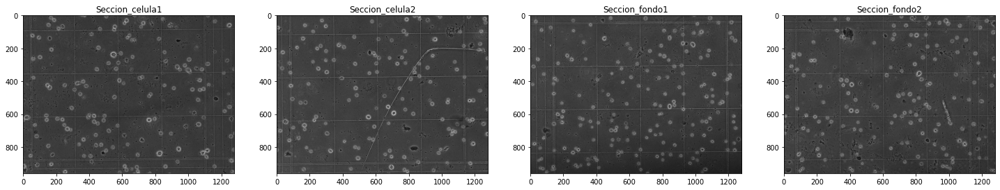

In [ ]:
e_SI = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_SI.JPG',0)
e_SD = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_SD.JPG',0)
e_ID = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_ID.JPG',0)
e_II = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_II.JPG',0)

plt.figure(figsize=(25,45))
plt.subplot(141),plt.imshow(e_SI, cmap="gray"), plt.title('Seccion_celula1')
plt.subplot(142),plt.imshow(e_SD, cmap="gray"), plt.title('Seccion_celula2')
plt.subplot(143),plt.imshow(e_ID, cmap="gray"), plt.title('Seccion_fondo1')
plt.subplot(144),plt.imshow(e_II, cmap="gray"), plt.title('Seccion_fondo2')
plt.show()

Las imágenes adquiridas son a color. A continuación se las descargo en RGB.

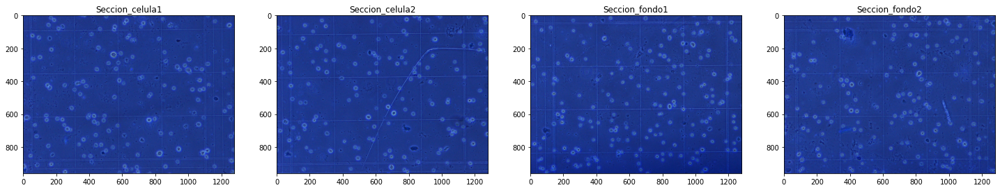

In [ ]:
e_SI_c = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_SI.JPG',1)
e_SD_c = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_SD.JPG',1)
e_ID_c = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_ID.JPG',1)
e_II_c = cv2.imread('/content/drive/MyDrive/TP integrador PIB/esq_II.JPG',1)

e_SI_RGB= cv2.cvtColor(e_SI_c, cv2.COLOR_BGR2RGB)
e_SD_RGB= cv2.cvtColor(e_SD_c, cv2.COLOR_BGR2RGB)
e_ID_RGB= cv2.cvtColor(e_ID_c, cv2.COLOR_BGR2RGB)
e_II_RGB= cv2.cvtColor(e_II_c, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(25,45))
plt.subplot(141),plt.imshow(e_SI_RGB, cmap="gray"), plt.title('Seccion_celula1')
plt.subplot(142),plt.imshow(e_SD_RGB, cmap="gray"), plt.title('Seccion_celula2')
plt.subplot(143),plt.imshow(e_ID_RGB, cmap="gray"), plt.title('Seccion_fondo1')
plt.subplot(144),plt.imshow(e_II_RGB, cmap="gray"), plt.title('Seccion_fondo2')
plt.show()

Como un primer paso, analizamos las distintas capas de la imagen por separado para determinar si alguna capa permitirá la segmentación de manera más fácil.

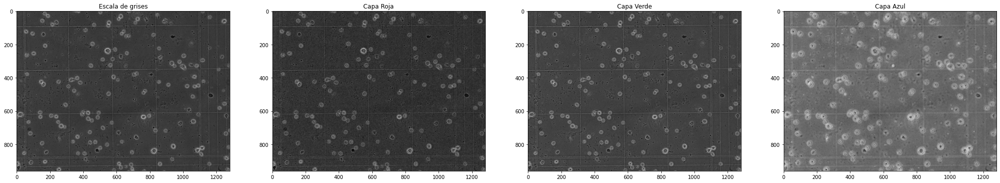

In [ ]:
#Podemos visualizar las distintas capas por separado

plt.figure(figsize=(35,45))
plt.subplot(141),plt.imshow(e_SI, cmap="gray"), plt.title('Escala de grises')
plt.subplot(142),plt.imshow(e_SI_RGB[:,:,0], cmap="gray"), plt.title('Capa Roja')
plt.subplot(143),plt.imshow(e_SI_RGB[:,:,1], cmap="gray"), plt.title('Capa Verde')
plt.subplot(144),plt.imshow(e_SI_RGB[:,:,2], cmap="gray"), plt.title('Capa Azul')
plt.show()

La capa azul es la que más borrosa presenta la información. Las células en dicha capa presentan un grueso aro blanco que causa muchas veces que se fusione con otra célula cercana. Esto es un gran problema ya que dificulta la segmentación y causaría que un bloque de células el algoritmo lo interprete como una.
 
En lo que respecta a la imágen en escala de grises y las capas roja y verde, son muy similares. El contraste de estas 3 imágenes es muy parecido y no parece haber ningún beneficio de una sobre la otra.


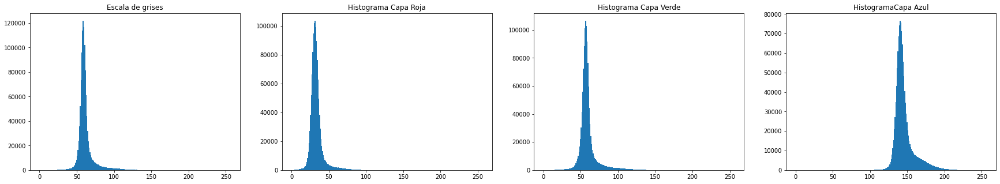

In [ ]:
plt.figure(figsize=(30,5))
plt.subplot(141),plt.bar(np.arange(256), histograma(e_SI,256), width=1.2, align='edge'), plt.title('Escala de grises')
plt.subplot(142),plt.bar(np.arange(256), histograma(e_SI_RGB[:,:,0],256), width=1.2, align='edge'), plt.title('Histograma Capa Roja')
plt.subplot(143),plt.bar(np.arange(256), histograma(e_SI_RGB[:,:,1],256), width=1.2, align='edge'), plt.title('Histograma Capa Verde')
plt.subplot(144),plt.bar(np.arange(256), histograma(e_SI_RGB[:,:,2],256), width=1.2, align='edge'), plt.title('HistogramaCapa Azul')

plt.show()

Si observamos los histogramas vemos que en morfología todos son muy parecidos. El histograma azul es el que está más corrido hacia los valores altos explicando la predominancia del blanco en la imágen.
 
El histograma verde y la escala de grises son muy parecidos, estando en el mismo rango aunque poseen una diferencia de amplitud.
 
Se eligió trabajar con la escala de grises ya que posee un buen contraste, aunque la capa verde también es una buena opción. Las diferencias entre ambas imágenes no son tan significativas y no presentan una notoria ventaja de una sobre la otra.

##Mejoramiento- Fitros Ruido

Las imágenes no presentan ruido significante luego de la adquisicion. Sin embargo, podemos pensar que el fondo de la imágen se considera ruido ya que no es de interés para los fines de este proyecto.

Por lo tanto, se aplica un filtro promediador para analizar si mejora la calidad de la imagen. Este filtro tiene el objetivo de suavizar la imágen.

Para filtrar la imágen primero se realiza el zeropadding de la imágen y después se le aplica un kernel promediador de 5x5 y otro de 3x3 y se analiza el resultado más optimo 

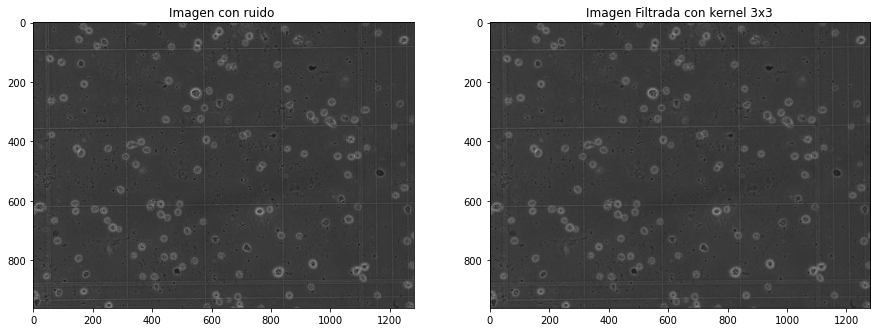

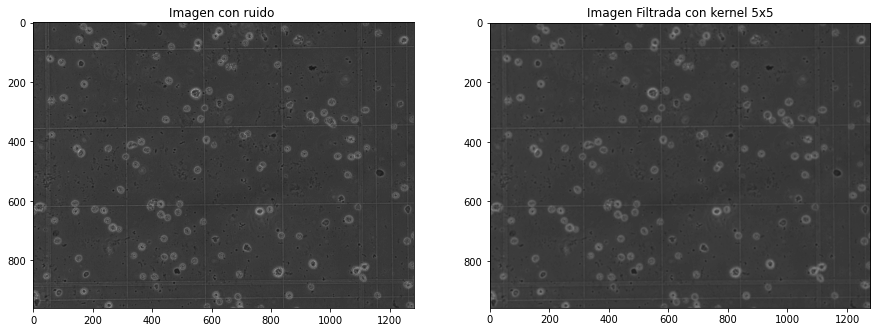

In [ ]:
def kernel_med(D):
  kernel = np.ones([D,D])
  return kernel
m1=kernel_med(3) #hago una mascara de 3x3
m2=kernel_med(5) #hago una mascara de 5x5

#Imagen paddiada
imagen_zp=zeropadding(e_SI,m1)

#Kermel
kernel_FP5 = 1/25 * np.array(([1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1])) #kernel promedio
kernel_FP3 = 1/9 * np.array(([1,1,1],[1,1,1],[1,1,1,])) #kernel promedio

#Imagenes suavizadas
imagen_filtrada1=convolucion(imagen_zp,kernel_FP5)
imagen_filtrada2=convolucion(imagen_zp,kernel_FP3)

plt.figure(figsize=(15,25))
plt.subplot(121),plt.imshow(e_SI, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.subplot(122),plt.imshow(imagen_filtrada2, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Filtrada con kernel 3x3')
plt.show()
plt.figure(figsize=(15,25))
plt.subplot(121),plt.imshow(e_SI, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.subplot(122),plt.imshow(imagen_filtrada1, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Filtrada con kernel 5x5')
plt.show()

Las imágenes resultantes no presentan ninguna mejoría aunque tampoco un empobrecimiento a simple vista. Sin embargo, más adelante en el trabajo se comprueba que el filtrado de la imágen mejora levemente la segmentación de la misma y por lo tanto se trabajará con la imágen filtrada.

##Escalado de intensidad

Para intentar facilitar la segmentación se probó aplicando un escalado de intensidad. El mismo se realizó a la imágen con ruido a las promediadas.

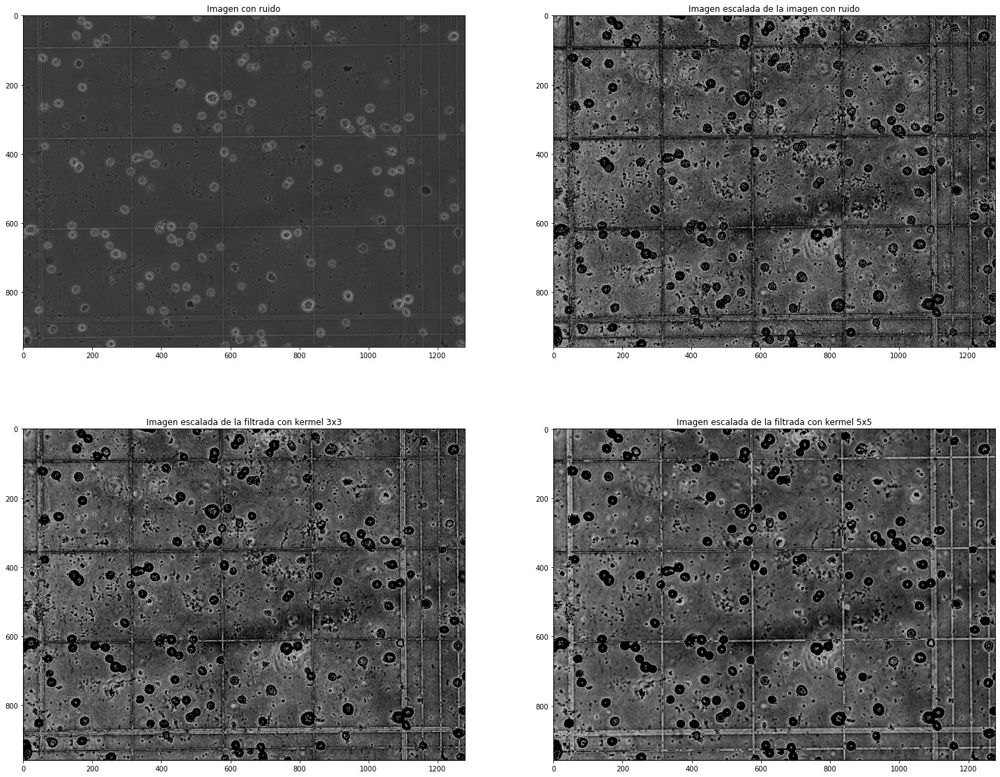

In [ ]:
#Escalado de intensidad
imagenescalada=escaladoIntensidad(e_SI,50,70,199)
imagenescalada2=escaladoIntensidad(imagen_filtrada2,50,70,199)
imagenescalada1=escaladoIntensidad(imagen_filtrada1,50,70,199)

plt.figure(figsize=(25,20))
plt.subplot(221),plt.imshow(e_SI, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido')
plt.subplot(222),plt.imshow(imagenescalada, cmap="gray", vmin=0, vmax=255), plt.title('Imagen escalada de la imagen con ruido')
plt.subplot(223),plt.imshow(imagenescalada2, cmap="gray", vmin=0, vmax=255), plt.title('Imagen escalada de la filtrada con kermel 3x3')
plt.subplot(224),plt.imshow(imagenescalada1, cmap="gray", vmin=0, vmax=255), plt.title('Imagen escalada de la filtrada con kermel 5x5')
plt.show()

Al aplicar escalado de intensidad, se observa que el fondo de la imágen es más nítido, que en este caso empeora el procesamiento. Al esclar la imágen aparecen partículas en el fondo que no son de interés. Además, ya no es posible distinguir tan fácilmente las células muertas de las vivas

##Deteccion de cuadrícula

Dado que por la dinámica del conteo celular es necesario analizar zonas en particular, se procederá a detectar la cuadrícula.  Para eso se analizarán distintas técnicas para posteriormente plantear el registro de la misma.

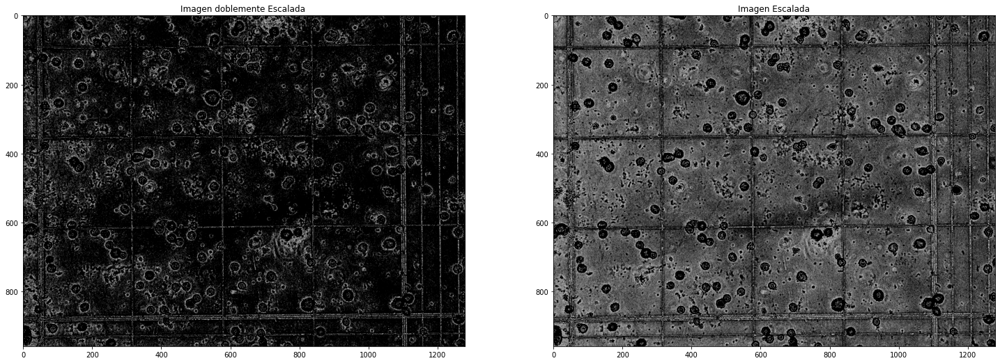

In [ ]:
imagenescalada_otravez=escaladoIntensidad(imagenescalada,90,199,199)
plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(imagenescalada_otravez, cmap="gray", vmin=0, vmax=255), plt.title('Imagen doblemente Escalada ')
plt.subplot(122),plt.imshow(imagenescalada, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Escalada')
plt.show()

Analizamos el tamaño de un único cuadrado

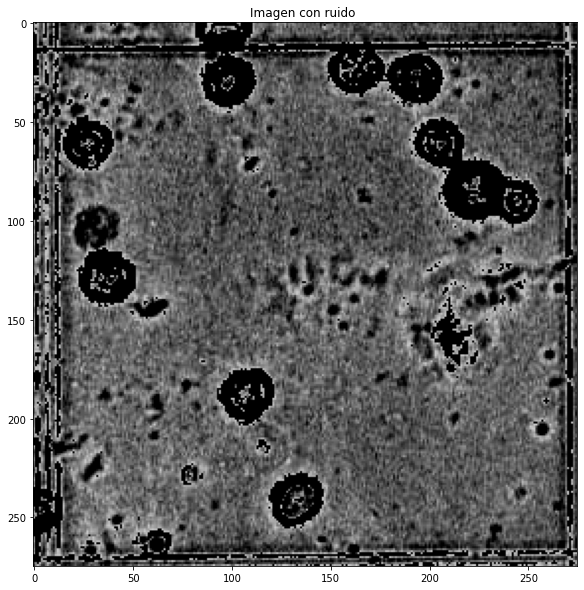

In [ ]:
recorte2 = imagenescalada[605:880, 45:320]
plt.figure(figsize=(25,10))
plt.subplot(111),plt.imshow(recorte2, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.show()


##Registración

A continuación se plantean algoritmos para detectar la cuadrícula y luego proceder al registro de la misma

### Detección de bordes

Inicialmente, se aplican los algoritmos de detección de bordes:

<!-- Se probó también segmentar con detección de bordes. Para eso se hizo por medió Prewitt Y Sobel. -->


In [ ]:
# Borde Horizontal Prewitt
hPrewitt = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

# Borde Horizontal Sobel: 
hSobel = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

# Borde Vertical Prewitt: 
vPrewitt = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

# Borde Vertical Sobel:
vSobel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])


In [ ]:
img_pad = zeropadding(Img_Otsu,vPrewitt)

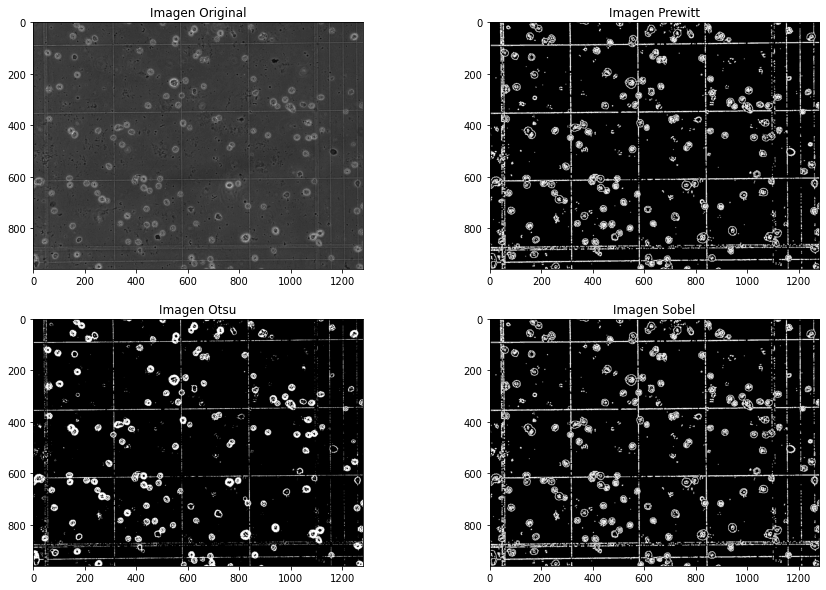

In [ ]:
img_Prewitt = BordesCombinados(img_pad,hPrewitt,vPrewitt,0.1)
img_Sobel = BordesCombinados(img_pad,hSobel,vSobel,0.1)

f1, axs1 = plt.subplots(1,4,figsize=(15,10))
plt.subplot(221)
plt.title('Imagen Original')
plt.imshow(Img_Otsu,cmap='gray')
plt.subplot(222)
plt.title('Imagen Prewitt')
plt.imshow(img_Prewitt,cmap='gray')
plt.subplot(223)
plt.title('Imagen Otsu')
plt.imshow(Img_Otsu,cmap='gray')
plt.subplot(224)
plt.title('Imagen Sobel')
plt.imshow(img_Sobel,cmap='gray')

Como es muy complejo aislar la cuadrícula de esta forma, procedemos a  crear una imágen de una cuadricula con las dimensiones adecuadas para poder registrarla con la imagen del microscopio. De esa forma, podremos encontrar la cuadricula de conteo dentro de la imagen del laboratorio de forma automatica. 


825
1100


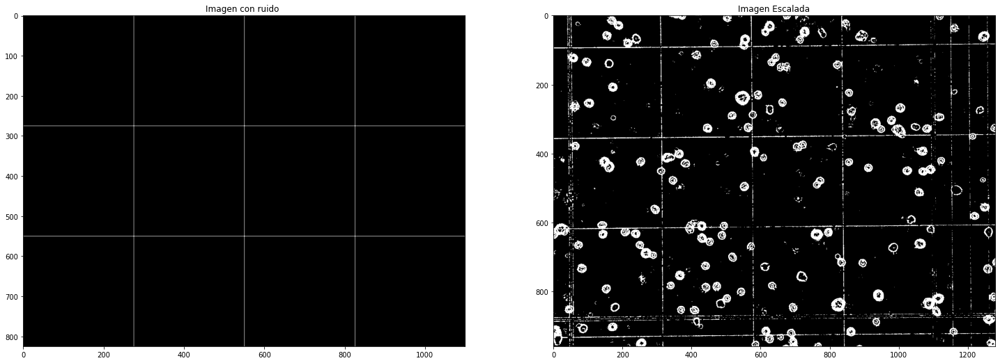

In [ ]:
umbral, Img_Otsu_escalada = cv2.threshold(e_SI,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
cuad = np.zeros((275*3, 275*4))
horiz=np.zeros((275*3, 275*4))
vertic=np.zeros((275*3, 275*4))

A = cuad.shape[0]
B = cuad.shape[1]
print(A)
print(B)
  
for i in range(A):
  for j in range(B):
    if(j%275==0):
      vertic[i,j]=255
for i in range(A):
  for j in range(B):
    if(i%275==0):
      horiz[i,j]=255
  


cuad=cuad+horiz+vertic


#umbral, cuad_otsu = cv2.threshold(cuad,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(cuad, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.subplot(122),plt.imshow(Img_Otsu, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Escalada')
plt.show()

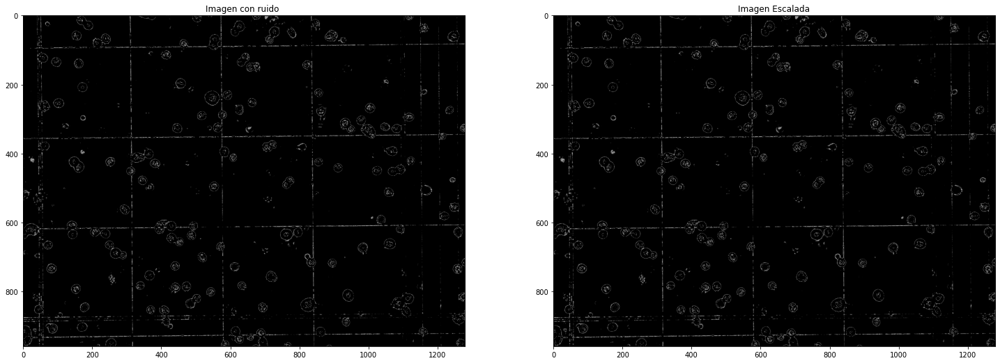

In [ ]:
imagenescalada2=escaladoIntensidad(imagen_gauss2,70,80,199)
plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(imagenescalada2, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.subplot(122),plt.imshow(imagenescalada2, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Escalada')
plt.show()

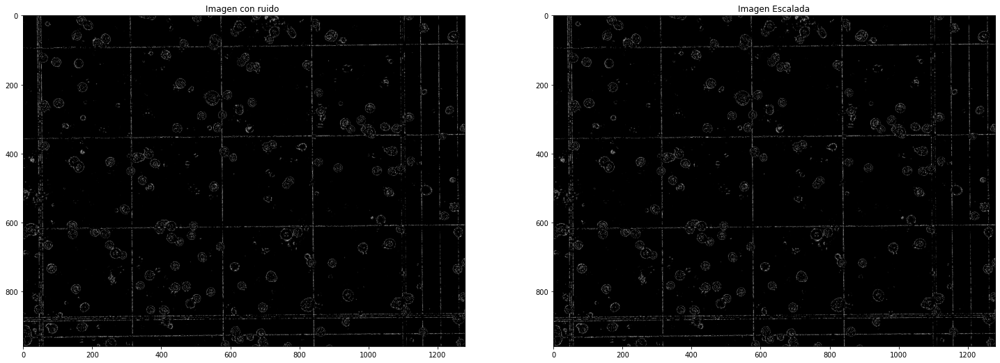

In [ ]:
imagenescalada=escaladoIntensidad(e_SI,70,80,199)
plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(imagenescalada, cmap="gray", vmin=0, vmax=255), plt.title('Imagen con ruido ')
plt.subplot(122),plt.imshow(imagenescalada, cmap="gray", vmin=0, vmax=255), plt.title('Imagen Escalada')
plt.show()

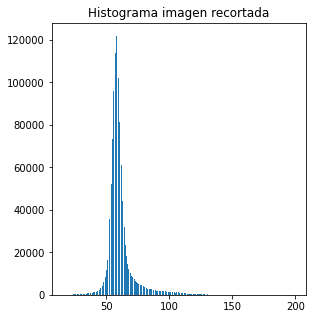

199


In [ ]:

plt.figure(figsize=(10,5))
plt.subplot(121),plt.hist(np.ravel(e_SI),bins=256), plt.title('Histograma imagen recortada')
plt.show()
print(np.max(e_SI))

## Segmentación de celulas: Primeros enfoques

##Canny 

Otra forma en la que se intentó segmentar fue por medio de Canny. Canny es un algoritmo que nos permite detectar bordes de un ancho de píxel. Se basa en el método de derivada primera. 

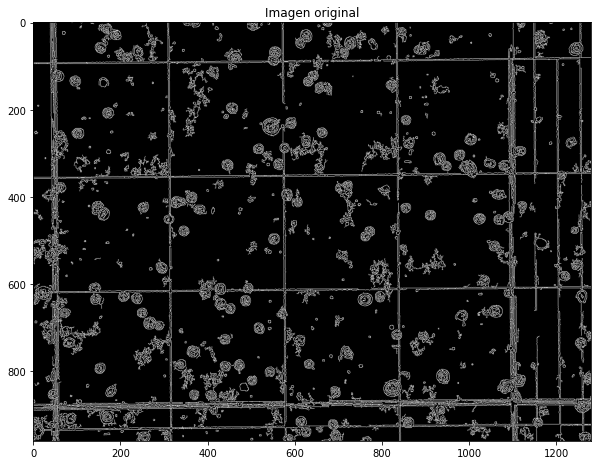

In [ ]:
canny=cv2.Canny(e_SI,10,150)
plt.figure(figsize=(10,10))
plt.subplot(111),plt.imshow(canny,cmap='gray'),plt.title('Imagen original')

plt.show()
ROI_number = 0 # encuentra todos los bordes del objeto que me devuelve coordenadas en x e y que

#me devuelve la coordenada del contorno, podemos usarla para armar rectangulo por cada contorno
#con eso puedo hacer cajita para cada celula, con eso puedo saber las dimensiones tambien lo puedo usar para contar celuals



A continuación a la imágen resultante se la dilato para unir huecos. 

(<matplotlib.axes._subplots.AxesSubplot at 0x7fcb64a94890>,
 Text(0.5, 1.0, 'Imagen original'))

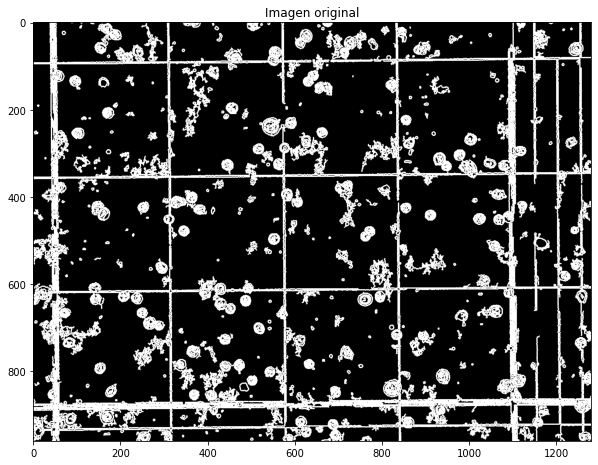

In [ ]:
canny_eros=dilatacion( canny)
plt.figure(figsize=(10,10))
plt.subplot(111),plt.imshow(canny_eros,cmap='gray'),plt.title('Imagen original')

El algoritmo es tan sensible que además de detectar los bordes de las células también detecta ruido de las imágenes. 

Con este método si se logró segmentar las células aunque no hace discriminación entre las vivas y las muertas. 

##Umbralización con Otsu

Si bien el histograma de la imágen no parecía ser bimodal, el contraste entre las células y el fondo era muy evidente, por lo que se probó segmentar con el método de Otsu. Este método se segmenta por umbral. El valor del umbral está relacionado con la varianza entre los píxeles que corresponde al objeto y el fondo. El resultado de aplicar este método es una imagen binaria y segmentada. 

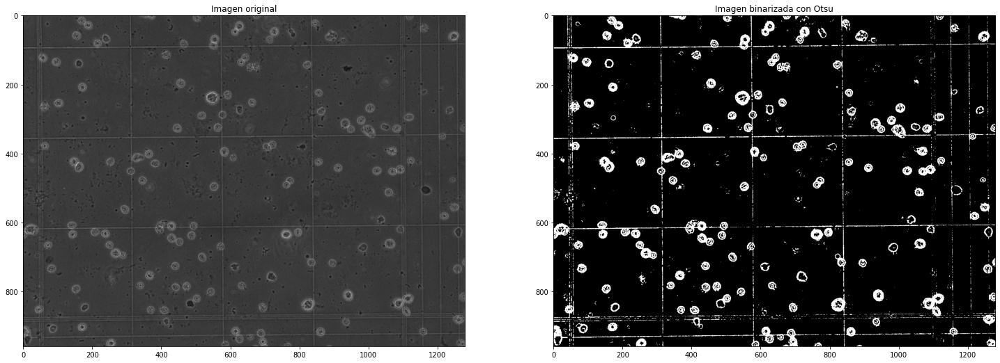

In [ ]:
umbral, Img_Otsu = cv2.threshold(e_SI,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(e_SI, cmap="gray", vmin=0, vmax=255), plt.title('Imagen original')
plt.subplot(122),plt.imshow(Img_Otsu,cmap='gray') , plt.title('Imagen binarizada con Otsu')
plt.show()

In [ ]:
print('Umbral obtenido con el método de Otsi:',umbral)

Umbral obtenido con el método de Otsi: 74.0


## Morfología

Para mejorar la imagen resultante del método de Otsu se la dilató con el objetivo de cerrar huecos y también se probó erosionandolo para eliminar los píxeles aislados o que no son de interés como las grillas.

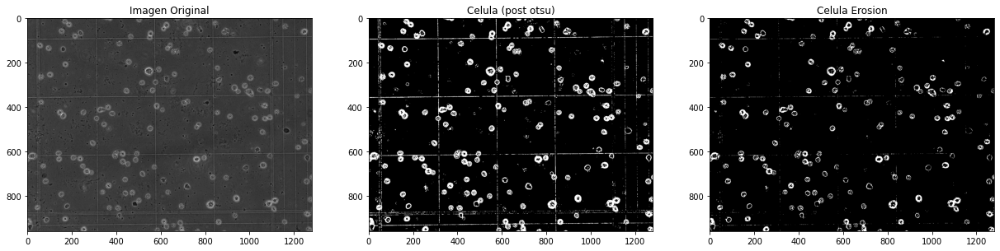

In [ ]:
celula_erosion = erosion(Img_Otsu)
f3, axs3 = plt.subplots(1,3,figsize=(21,21))
plt.subplot(131) 
plt.title('Imagen Original')
plt.imshow(e_SI,cmap='gray')

plt.subplot(132)
plt.title('Celula (post otsu)')
plt.imshow(Img_Otsu,cmap = 'gray')

plt.subplot(133)
plt.title('Celula Erosion')
plt.imshow(celula_erosion,cmap = 'gray')


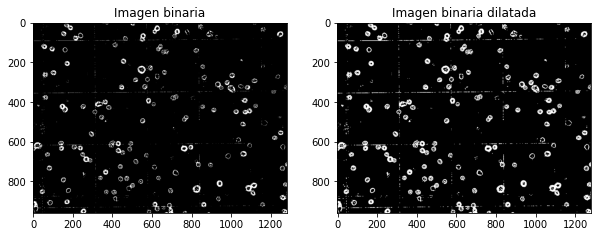

In [ ]:
kernel = np.ones((5, 5), 'uint8')
dilate_img = dilatacion(celula_erosion)


plt.figure(figsize=(10,10))
plt.subplot(121),plt.imshow(celula_erosion,cmap='gray'),plt.title('Imagen binaria')
plt.subplot(122),plt.imshow(dilate_img,cmap='gray'), plt.title('Imagen binaria dilatada')
plt.show()

##Etiquetado de imagenes

Para contar la cantidad de células se etiquetó tanto a la imagen dilatada como a la erosionada. 

In [ ]:
# Etiqueto las imagenes

Etiquetada = etiquetado(celula_erosion)
Etiquetada_dilatada=etiquetado(dilate_img)

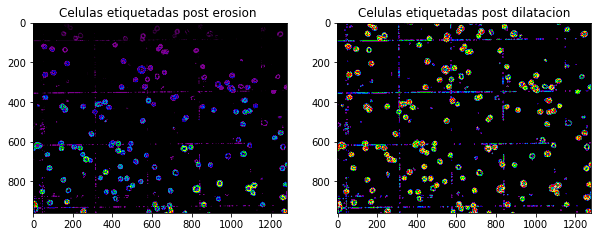


 La cantidad de celulas etiquetados es: 1116

 La cantidad de celuas etiquetados es: 715


In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(121),plt.imshow(Etiquetada, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post erosion ')
plt.subplot(122),plt.imshow(dilate_img, cmap=plt.cm.nipy_spectral), plt.title('Celulas etiquetadas post dilatacion')
plt.show()

# Resto uno a la cantidad ya que el etiquetado tiene en cuenta el fondo de la imagen
print('\n La cantidad de celulas etiquetados es:',int(np.max(Etiquetada))-1)
print('\n La cantidad de celuas etiquetados es:',int(np.max(Etiquetada_dilatada))-1)


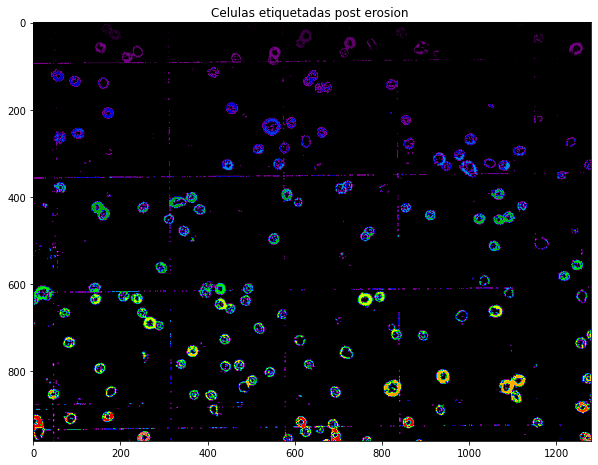

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(111),plt.imshow(Etiquetada, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post erosion ')

plt.show()

Además de que el etiquetado no es óptimo, hasta aquí estos algoritmos no permiten distinguir las células vivas de las muertas. Por lo tanto se procede a implementar el algoritmo de Kmeans

## Segmentación de células Enfoque: Kmeans

Aplicamos otro método para segmentar, este fue kmeans de 3 cluster. En el primer cluster tenemos segmentado manchas del fondo y células muertas.  En el segundo, se encuentra el fondo. Y en el último están segmentadas las células vivas. Este algoritmo posee la gran ventaja de poder obtener una imagen binaria de solamente las células vivas. Aunque de todas maneras la imagen posee huecos y píxeles aislados. Con morfología se puede mejorar la imagen. 

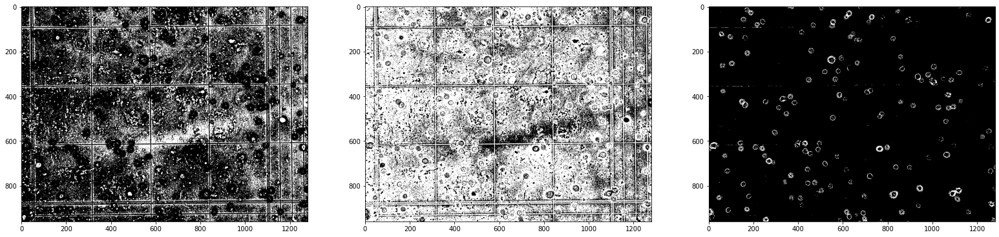

In [ ]:
celula,imagenC2,total,C1,C2,C3 = kmeans(e_SI,20,90,150)

f1, axs1 = plt.subplots(1,3,figsize=(27,27))
plt.subplot(131)
plt.imshow(celula,cmap = 'gray')
plt.subplot(132)
plt.imshow(imagenC2,cmap = 'gray')
plt.subplot(133)
plt.imshow(total,cmap = 'gray')

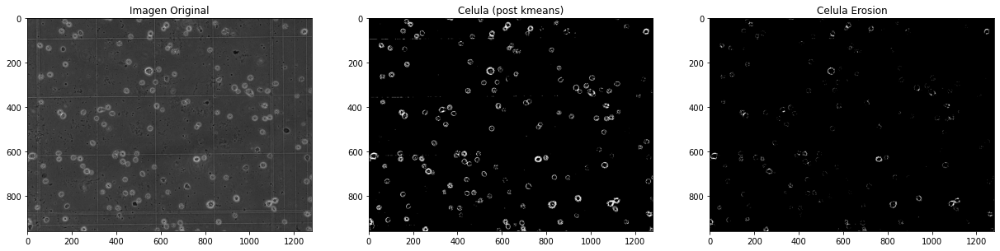

In [ ]:
celula_erosion_kmean = erosion( total)
f3, axs3 = plt.subplots(1,3,figsize=(21,21))
plt.subplot(131) 
plt.title('Imagen Original')
plt.imshow(e_SI,cmap='gray')

plt.subplot(132)
plt.title('Celula (post kmeans)')
plt.imshow(total,cmap = 'gray')

plt.subplot(133)
plt.title('Celula Erosion')
plt.imshow(celula_erosion_kmean,cmap = 'gray')

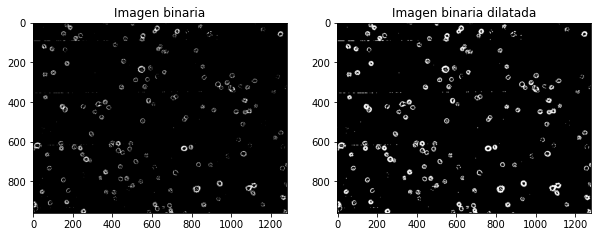

In [ ]:
dilate_img_kmeans = dilatacion(total)

plt.figure(figsize=(10,10))
plt.subplot(121),plt.imshow(total,cmap='gray'),plt.title('Imagen binaria')
plt.subplot(122),plt.imshow(dilate_img_kmeans,cmap='gray'), plt.title('Imagen binaria dilatada')
plt.show()

##Etiquetado Kmeans

Nuevamente aplicamos etiquetado a la imagen binaria para poder contar la cantidad de células. 

In [ ]:
Etiquetada_dilatada_kmeans=etiquetado(dilate_img_kmeans)

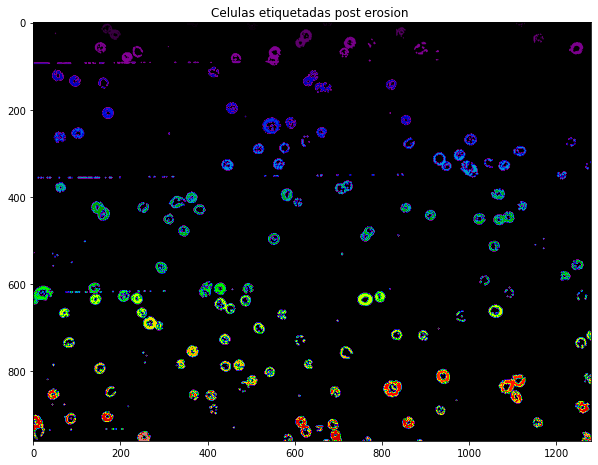


 La cantidad de celuas etiquetados es: 437


In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(111),plt.imshow(Etiquetada_dilatada_kmeans, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post erosion ')

plt.show()
print('\n La cantidad de celuas etiquetados es:',int(np.max(Etiquetada_dilatada_kmeans))-1)


El resultado obtenido nuevamente no es óptimo y hay un sobretiquetado de células. 

## Enfoque

A continuación se implementarán algoritmos teniendo en cuenta las células muertas y las vivas. Se realizará una segmentación de acuerdo a esto y se buscará que la cantidad de etiquetas asignadas sea consistente con lo que se puede observar a simple vista


Para intentar eliminar células muertas primero se seleccionó un cuadrado en donde había tanto células vivas como muertas. La imágen con la que se trabajo fue la promediada con el kermel 3x3.

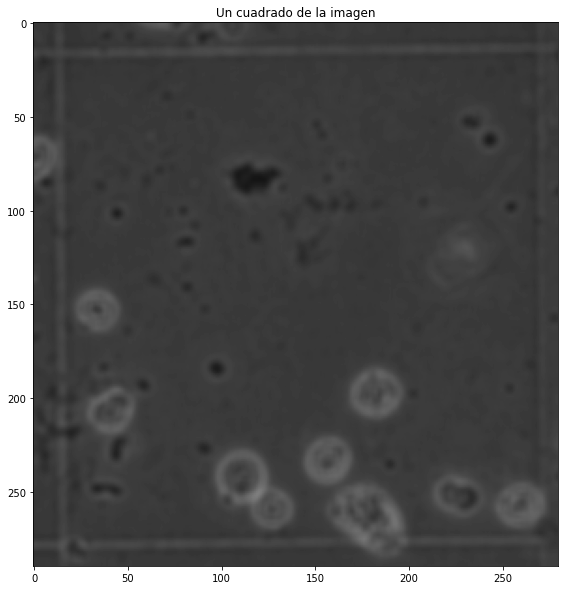

In [ ]:
cuadrado = imagen_filtrada1[70:360, 820:1100]
plt.figure(figsize=(25,10))
plt.subplot(111),plt.imshow(cuadrado, cmap="gray", vmin=0, vmax=255), plt.title('Un cuadrado de la imagen')
plt.show()

Y se seleccionó una célula viva y otra muerta para estudiar sus valores. Los valores a analizar son su valor máximo, el mínimo y el valor promedio. 

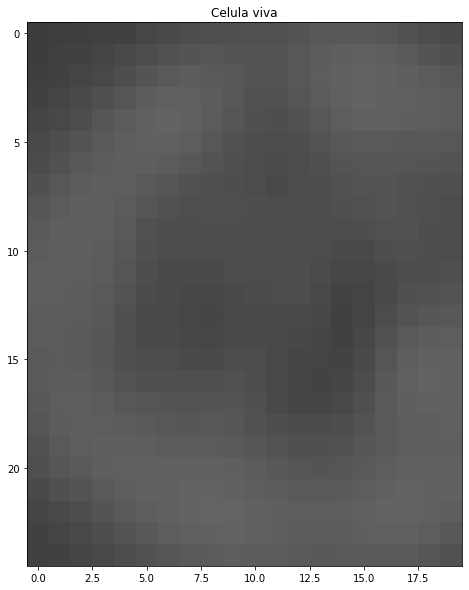

In [ ]:
celulaviva = imagen_filtrada1[255:280, 990:1010]
plt.figure(figsize=(25,10))
plt.subplot(111),plt.imshow(celulaviva, cmap="gray", vmin=0, vmax=255), plt.title('Celula viva')
plt.show()

In [ ]:
print(celulaviva)

In [ ]:
print("Valor máximo:",int(np.max(celulaviva)))
print("Valor mínimo:",int(np.min(celulaviva)))
print("Valor promedio:",int(np.mean(celulaviva)))

Valor máximo: 99
Valor minimo: 60
Valor promedio: 84


La célula viva seleccionada posee valores de 60 a 99.

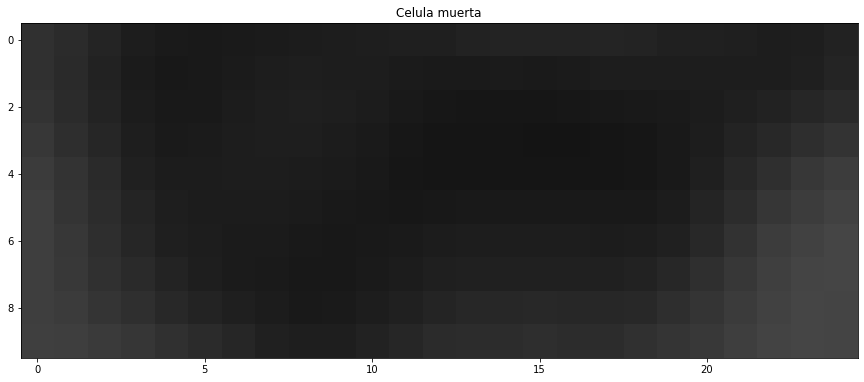

In [ ]:
celulamuerta = imagen_filtrada1[150:160, 925:950]
plt.figure(figsize=(15,10))
plt.subplot(111),plt.imshow(celulamuerta, cmap="gray", vmin=0, vmax=255), plt.title('Celula muerta')
plt.show()

In [ ]:
print(celulamuerta)

In [ ]:
print("Valor máximo:",int(np.max(celulamuerta)))
print("Valor mínimo:",int(np.min(celulamuerta)))
print("Valor promedio:",int(np.mean(celulamuerta)))

Valor máximo: 69
Valor minimo: 20
Valor promedio: 36


La célula muerta seleccionada posee valores de 20 a 69.

Por lo que la célula muerta posee un rango de intensidad casi incompatible con la célula viva. Por lo que la idea es crear una función que cree una imágen de ceros salvo el las posiciones en donde se encuentre las células muertas. Allí se reemplazará el valor cero por el correspondiente a la posición en la que se encuentra. Para eso se fija un umbral. El umbral va a poseer como valor mínimo el mínimo de la célula muerta y como valor máximo el máximo de la célula muerta. 

In [ ]:
def umbralizado(imagen,f1,f2):
  imagen_res=np.zeros(np.shape(imagen))

  for i in range(np.shape(imagen)[0]):
    for j in range(np.shape(imagen)[1]):
      if f1<=imagen[i,j]<=f2:
        imagen_res[i,j]=imagen[i,j]

  return imagen_res


La imagen resultante posee las celulas vivas en negro (0) y las muertas en su tono original, junto con el fondo. 
Lo que se realiza a continuación es aplicar una función de umbralización donde se establecen las células vivas como blanco y el resto en negro. De esta forma las células muertas son eliminadas de la imágen y se puede proceder a contar las células vivas.

In [ ]:
def umbralizado_negro(imagen,f1,f2):
  imagen_res=np.zeros(np.shape(imagen))

  for i in range(np.shape(imagen)[0]):
    for j in range(np.shape(imagen)[1]):
      if imagen[i,j]==0:
        imagen_res[i,j]=1

  return imagen_res

In [ ]:
imagen_res=umbralizado(imagen_filtrada1,20,80)
imagen_celulas=umbralizado_negro(imagen_res,1,255)


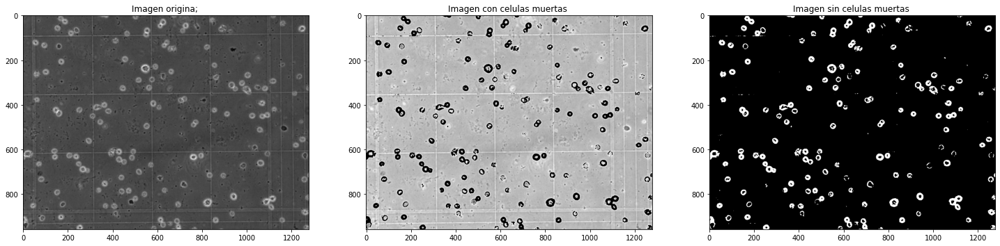

In [ ]:
plt.figure(figsize=(25,10))
plt.subplot(131),plt.imshow(imagen_filtrada1, cmap="gray"), plt.title('Imagen origina; ')
plt.subplot(132),plt.imshow(imagen_res, cmap="gray"), plt.title('Imagen con celulas muertas ')
plt.subplot(133),plt.imshow(imagen_celulas, cmap="gray"), plt.title('Imagen sin celulas muertas ')
plt.show()

Para mejorar la imágen se aplican funciones de morfología matemática

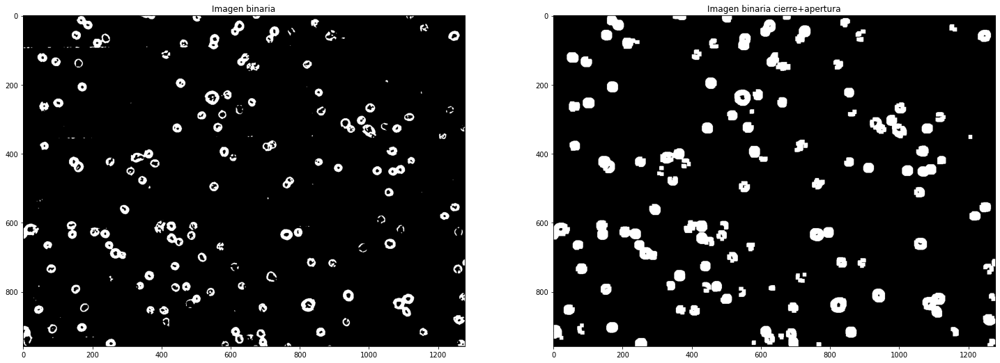

In [ ]:
kernel0 = np.ones((9, 9), 'uint8')
kernel1 = np.ones((5, 5), 'uint8')
kernel2 = np.ones((3, 3), 'uint8')
kernel5 = np.ones((11, 11), 'uint8')


erosion1=cv2.erode(imagen_celulas, kernel2, iterations=2)
dilatacion1= cv2.dilate(erosion1, kernel5, iterations=1)

plt.figure(figsize=(25,10))
plt.subplot(121),plt.imshow(imagen_celulas,cmap='gray'),plt.title('Imagen binaria')
plt.subplot(122),plt.imshow(dilatacion1,cmap='gray'), plt.title('Imagen binaria cierre+apertura')
plt.show()


Posteriormente se etiqueta la imagen para contar las células. 


In [ ]:
imagenKmeans3dilate = dilatacion1.astype("uint8")
ret, labels = cv2.connectedComponents(imagenKmeans3dilate)
print(ret)

111


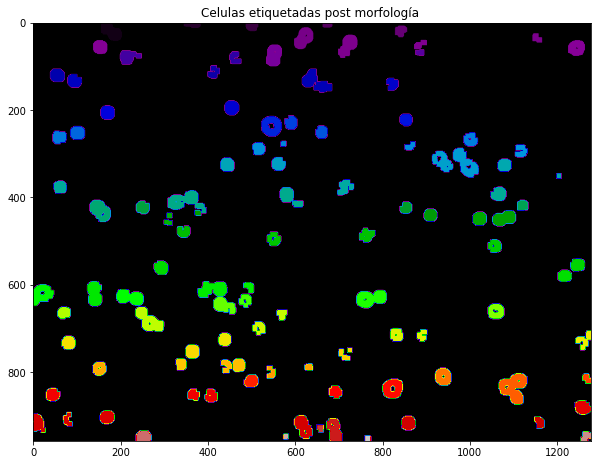

In [ ]:
plt.figure(figsize=(10,10))
plt.subplot(111),plt.imshow(labels, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post morfología ')

plt.show()

##Función de conteo de células

In [ ]:
def kernel_med(D):
  kernel = np.ones([D,D])
  return kernel
m1=kernel_med(3) #hago una mascara de 3x3
m2=kernel_med(5) #hago una mascara de 5x5

In [ ]:
def contar_celulas_uncuad(img):
 #Imagen paddiada
 imagen_zp=zeropadding(img,m1)
 #Kermel
 kernel_FP5 = 1/25 * np.array(([1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1])) #kernel promedio
 #Imagenes suavizadas
 imagen_filtrada=convolucion(imagen_zp,kernel_FP5)
 imagen_umb=umbralizado(imagen_filtrada,20,80)
 imag_cel=umbralizado_negro(imagen_umb,1,255)
 kernel0 = np.ones((9, 9), 'uint8')
 kernel1 = np.ones((5, 5), 'uint8')
 kernel2 = np.ones((3, 3), 'uint8')
 kernel5 = np.ones((11, 11), 'uint8')
 erosionar=cv2.erode(imag_cel, kernel2, iterations=2)
 # Aplico apertura
 dilatar= cv2.dilate(erosionar, kernel5, iterations=1)
 img_dilatada = dilatar.astype("uint8")
 cant, cel = cv2.connectedComponents(img_dilatada)

 return cant,cel




In [ ]:
def contar_celulas(img1,img2,img3,img4,dilucion):
  conteo1,im1=contar_celulas_uncuad(img1)
  conteo2,im2=contar_celulas_uncuad(img2)
  conteo3,im3=contar_celulas_uncuad(img3)
  conteo4,im4=contar_celulas_uncuad(img4)
  
  plt.figure(figsize=(25,25))
  plt.subplot(141),plt.imshow(im1, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas a ')
  plt.subplot(142),plt.imshow(im2, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post morfología ')
  plt.subplot(143),plt.imshow(im3, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post morfología ')
  plt.subplot(144),plt.imshow(im4, cmap=plt.cm.nipy_spectral),plt.title('Celulas etiquetadas post morfología ')
  plt.show()


  prom=int((conteo1+conteo2+conteo3+conteo4)/4)
  total=conteo1+conteo2+conteo3+conteo4
  print('La cantidad de celulas promedio por cuadrado es', prom)

  formula=int(total/(0.25*3*1*4*1/10*dilucion))
  print('Cantidad de células por uL=',formula)

  return prom,formula




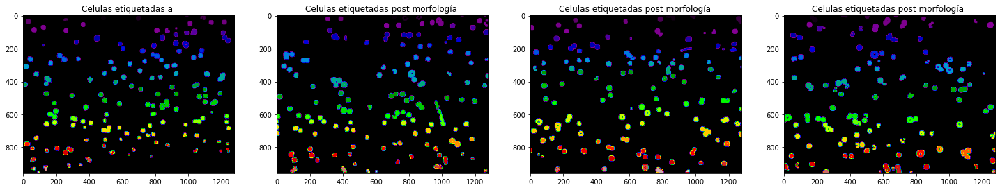

La cantidad de celulas promedio por cuadrado es 128
Cantidad de células por uL= 3420


(128, 3420)

In [ ]:
contar_celulas(e_ID,e_II,e_SD,e_SI,0.5)

# GUI




Se desarrolló una GUI con QT Designer en donde el usuario ingresa las 4 imágenes y las recorta. Además, el usuario ingresa el factor de dilución para poder obtener la cantidad de células por uL.'

[https://drive.google.com/file/d/1uu3YegEMPtuN7lYzfuC4vZrCZTUcz0Un/view?usp=sharing](https://)



#Eficiencia del algoritmo

* **Promedio conteo manual= 97.25**



* **Promedio conteo algoritmo= 91.5**


* 95% de efectividad



